In [1]:
%matplotlib notebook
import os
import os.path as path
import pandas as pd
import h5py
import numpy as np
from faker import Factory
import matplotlib.pyplot as plt
from plotly.offline import init_notebook_mode, iplot
from plotly.graph_objs import *
import plotly
import ipywidgets as widgets

# Local module and scripts
from pyccapt.calibration.calibration_tools import data_tools, variables, tools, reconstruction
from pyccapt.calibration.calibration_tools import reconstruction
from pyccapt.calibration.calibration_tools import widgets as wd


In [2]:
save_fig=False
plot_fig=True 

In [3]:
# flightPathLength = 110 # mm 
# # The initial value for t_0
# t0 = 51.74 # ns

# dataset name
# AL_data_b
# OLO_AL_6_data
# OLO_W_6_data
# OLO_Ni_8_data
# X6Cr17_2V30Min_5_data
# data_1029_Jun-27-2022_15-53_Pd
# data_115_Jul-27-2022_17-44_Powersweep3

In [108]:
tdc, dataset, flightPathLength_d, t0_d = wd.dataset_tdc_selection()
display(tdc, dataset, flightPathLength_d, t0_d)

Dropdown(description='TDC model:', options=('surface_concept', 'roentdec'), value='surface_concept')

Text(value='OLO_AL_6_data', description='Dataset:', placeholder='Paste ticket description here!')

Text(value='110', description='Flight path length:', placeholder='Flight path length')

Text(value='51.74', description='t0:', placeholder='T_0 of the instrument')

$$\textbf{You can specify which dataset to use in below block}$$

In [109]:
tdc_model = tdc.value
pulse_mode_ini = pulse_mode.value

dataset_name = dataset.value

flightPathLength = float(flightPathLength_d.value) # mm 
# The initial value for t_0
t0 = float(t0_d.value) # ns

p = path.abspath(path.join("", "../../../.."))

variables.init()

path_main = os.path.join(p, 'tests//data')
filename_main = path_main + '//' + dataset_name + '.h5'

variables.path = os.path.join(p, 'tests//results//ion_type_selection')
variables.result_path = os.path.join(p, 'tests/results/reconstruction/' + dataset_name)
if not os.path.isdir(variables.result_path):
        os.makedirs(variables.result_path, mode=0o777, exist_ok=True)
        
filename = variables.path + '//' + dataset_name + '//' + dataset_name + '.h5'


head, tail = os.path.split(filename)
figname = os.path.splitext(tail)[0]

data = data_tools.read_hdf5_through_pandas(filename)



In [110]:
data

,dld/high_voltage,dld/pulse_voltage,dld/start_counter,dld/t,dld/x,dld/y
0,6114.609863,6114.609863,57810.0,618.200694,9.137143,-12.957551
1,6114.609863,6114.609863,57812.0,3703.292568,18.369796,-22.349388
2,6114.609863,6114.609863,57850.0,596.522556,5.985306,-10.060408
3,6114.609863,6114.609863,58108.0,613.256076,20.534694,-20.057143
4,6114.609863,6114.609863,58138.0,592.544916,17.764898,-23.304490
...,...,...,...,...,...,...
1179841,7952.031250,7952.031250,54449.0,536.076144,-12.225306,8.468571
1179842,7952.031250,7952.031250,54463.0,534.690828,-1.114286,-17.860408
1179843,7952.031250,7952.031250,54607.0,540.705294,28.621224,-5.635102
1179844,7952.031250,7952.031250,54665.0,541.720278,28.111837,-9.232653


In [113]:
mc = data['mc (Da)'].to_numpy()

10-11-2022 13:04:00 | INFO | Selected Mode = count
10-11-2022 13:04:00 | INFO | Selected Mode = count


<IPython.core.display.Javascript object>


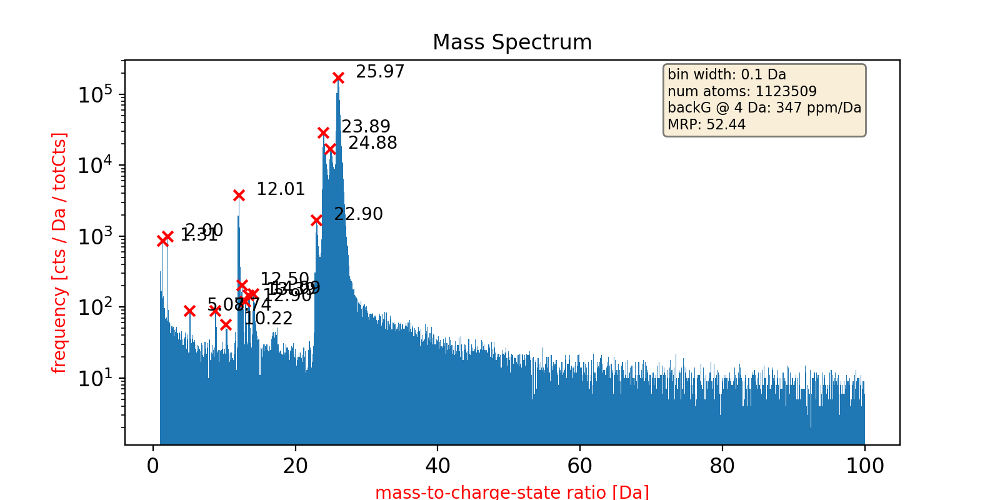

Mass resolving power for the highest peak (MRP --> m/m_2-m_1): [52.44120779]
Peaks  0 is: 1.31 peak window sides are: 1.21 - 1.41
Peaks  1 is: 2.00 peak window sides are: 1.90 - 2.10
Peaks  2 is: 5.07 peak window sides are: 4.97 - 5.27
Peaks  3 is: 8.74 peak window sides are: 8.64 - 8.94
Peaks  4 is: 10.22 peak window sides are: 10.12 - 10.52
Peaks  5 is: 12.01 peak window sides are: 11.81 - 12.11
Peaks  6 is: 12.50 peak window sides are: 11.81 - 12.60
Peaks  7 is: 12.90 peak window sides are: 12.80 - 13.20
Peaks  8 is: 13.39 peak window sides are: 13.29 - 13.59
Peaks  9 is: 14.09 peak window sides are: 13.89 - 14.28
Peaks  10 is: 22.90 peak window sides are: 22.70 - 23.20
Peaks  11 is: 23.89 peak window sides are: 23.70 - 24.19
Peaks  12 is: 24.88 peak window sides are: 24.69 - 26.67
Peaks  13 is: 25.97 peak window sides are: 25.68 - 26.17


In [114]:
max_hist_p, left_right_peaks_p, peaks_sides_p, max_paek_edges_p, index_max_p = tools.massSpecPlot(mc[mc < 100], 0.1, prominence=40, distance=2, text_loc='right', percent=50, plot=True, fig_name='mc'+figname, peaks_find_plot=True)
mrp = (max_hist_p / (left_right_peaks_p[1] - left_right_peaks_p[0]))
print('Mass resolving power for the highest peak (MRP --> m/m_2-m_1):', mrp)
peak_list = []
for i in range(len(peaks_sides_p)):
    peak_list.append(peaks_sides_p[i,0])
    print('Peaks ', i, 'is: {:.2f}'.format(peaks_sides_p[i,0]), 'peak window sides are: {:.2f} - {:.2f}'.format(peaks_sides_p[i,2], peaks_sides_p[i,3]))

In [117]:
element = wd.density_field_selection()
display(element)

Dropdown(description='Element', options=((1, 'H', 52.7, 0.0), (2, 'He', 28.7, 0.0), (3, 'Li', 46.3, 14.0), (4,…

In [118]:
avg_dens = widgets.FloatText(
    value=element.value[2],
    description='Desnsity:',
    disabled=False
)
field_evap = widgets.FloatText(
    value=element.value[3],
    description='Filed_Evap:',
    disabled=False
)
kf = widgets.FloatText(
    value=4,
    description='K_f:',
    disabled=False
)
det_eff = widgets.FloatText(
    value=0.7,
    description='det_eff:',
    disabled=False
)
icf = widgets.FloatText(
    value=1.4,
    description='ICF:',
    disabled=False
)
flight_path_length = widgets.FloatText(
    value=110,
    description='Flight_path_lenght:',
    disabled=False
)
display(avg_dens, field_evap, kf, det_eff, icf, flight_path_length)

FloatText(value=85.0, description='Desnsity:')

FloatText(value=42.0, description='Filed_Evap:')

FloatText(value=4.0, description='K_f:')

FloatText(value=0.7, description='det_eff:')

FloatText(value=1.4, description='ICF:')

FloatText(value=110.0, description='Flight_path_lenght:')

In [220]:
px, py, pz = reconstruction.atom_probe_recons_from_detector_Gault_et_al(dld_x, dld_y, dld_highVoltage, flight_path_length=flight_path_length.value, kf=kf.value, det_eff=det_eff.value, icf=icf.value, field_evap=field_evap.value, avg_dens=60.2)

In [68]:
# px, py, pz = reconstruction.atom_probe_recons_Bas_et_al(dld_x, dld_y, dld_highVoltage, flight_path_length=flight_path_length.value, kf=kf.value, det_eff=det_eff.value, icf=icf.value, field_evap=field_evap.value, avg_dens=60.2)

In [69]:
peak_list

[1.308176995948065,
 2.0015899864935505,
 5.072418944623557,
 8.737601894649696,
 10.223486874390021,
 12.006548850078413,
 12.501843843325188,
 12.898079837922609,
 13.393374831169384,
 14.08678782171487,
 22.903038701507473,
 23.893628688001023,
 24.884218674494573,
 25.97386765963748]

In [141]:
phases = ['H1(+)', 'H2(+)', 'O(++)', 'H2O(+)', 'P(3+)', 'C12(+)', '12.49', 'C13(+)', '13.47', 'Si28(+)', 'Fe57(2+)', 'Cr52(2+)', 'Fe55(2+)', 'Fe56(2+)']
colors = ['#ab2020', '#224d90', '#47684c', '#e2e14c', '#0492c2', '#7ea1ad', '#8b324d', '#7b7cf8', '#74632b', '#eed5b7', '#50ffd6', '#c9f2c9','#99c35f', '#0c2aac']
# phases = ['H1(+)', 'Al(2+)', 'Al(+)' ]
# colors = ['#ab2020', '#224d90', '#47684c']

In [222]:
fake = Factory.create()
plotly_data = list()
max_plot = 0.1
for index, element in enumerate(phases):
    mask = np.logical_and((peaks_sides_p[index,2] < mc), (mc < peaks_sides_p[index,3])).squeeze()
    print(mask[mask==True].shape)
    # to reduce the number of ions to plot base on the input maxplot percent
    if index==12 or index==13:
        max_plot = 0.02
    index_true = np.where(mask==True)
    index_get_to_false = np.random.choice(index_true[0], size=int(index_true[0].shape[0] - index_true[0].shape[0]*max_plot), replace=False)
    mask[index_get_to_false] = False
    print('ploted ions',mask[mask==True].shape)
    
    scatter = dict(
        mode="markers",
        name=element,
        type="scatter3d",
        x=px[mask], y=py[mask], z=pz[mask],
        opacity = 0.2,
        marker = dict(size=2, color=colors[index]) #fake.hex_color()
    )
    plotly_data.append(scatter)

layout = dict(
    title = 'APT 3D Point Cloud',
    scene = dict(xaxis = dict(zeroline=False, title='x (nm)'),
                yaxis = dict(zeroline=False, title='y (nm)'),
                zaxis = dict(zeroline=False, title='z (nm)', autorange='reversed'))
)

fig = dict(data=plotly_data, layout=layout)

init_notebook_mode(connected=True)  
# plotly.offline.plot(fig, filename=variables.result_path + '\\{fn}.html'.format(fn=figname), show_link=False)
iplot(fig)

(992,)
ploted ions (100,)
(1057,)
ploted ions (106,)
(195,)
ploted ions (20,)
(168,)
ploted ions (17,)
(157,)
ploted ions (16,)
(5760,)
ploted ions (576,)
(7934,)
ploted ions (794,)
(316,)
ploted ions (32,)
(310,)
ploted ions (31,)
(399,)
ploted ions (40,)
(5587,)
ploted ions (559,)
(98264,)
ploted ions (9827,)
(914520,)
ploted ions (18291,)
(605176,)
ploted ions (12104,)


<IPython.core.display.Javascript object>


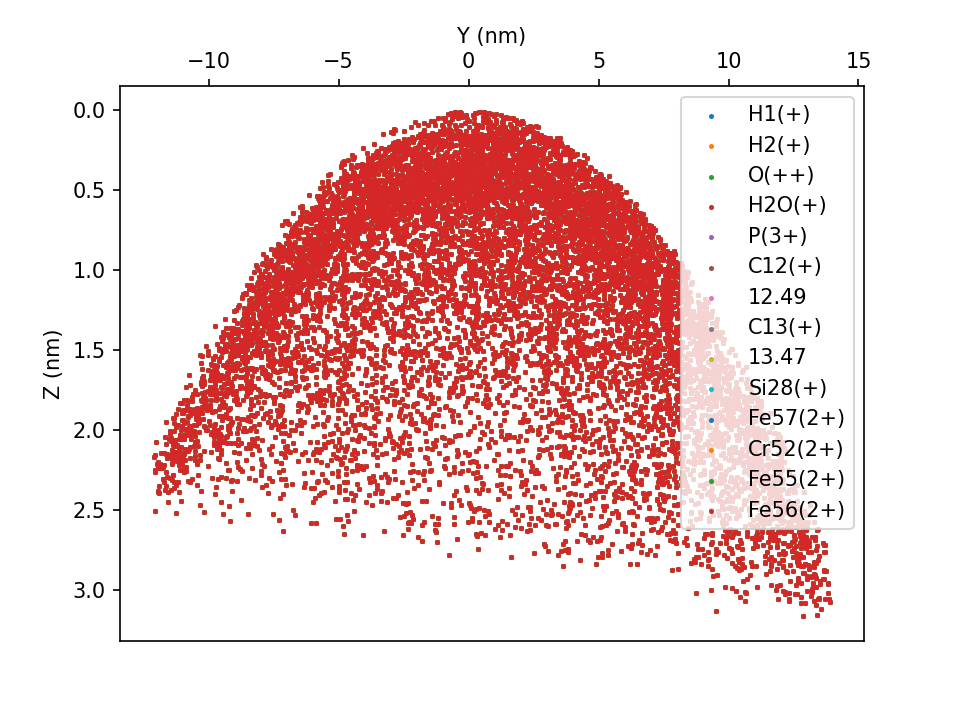

In [54]:
ax = plt.figure().add_subplot(111)
plot_num = 0.01
index_plot= np.random.choice(px, size=int(plot_num * len(px)), replace=False)
index_plot = np.where(index_plot)
for element in phases:
    ax.scatter(py[index_plot], pz[index_plot], s=2, label=element)
ax.xaxis.tick_top()
ax.invert_yaxis()
ax.set_xlabel('Y (nm)')
ax.xaxis.set_label_position('top')
ax.set_ylabel('Z (nm)')
plt.legend()
plt.savefig(variables.result_path + '\\output_{fn}.png'.format(fn=figname))

<IPython.core.display.Javascript object>


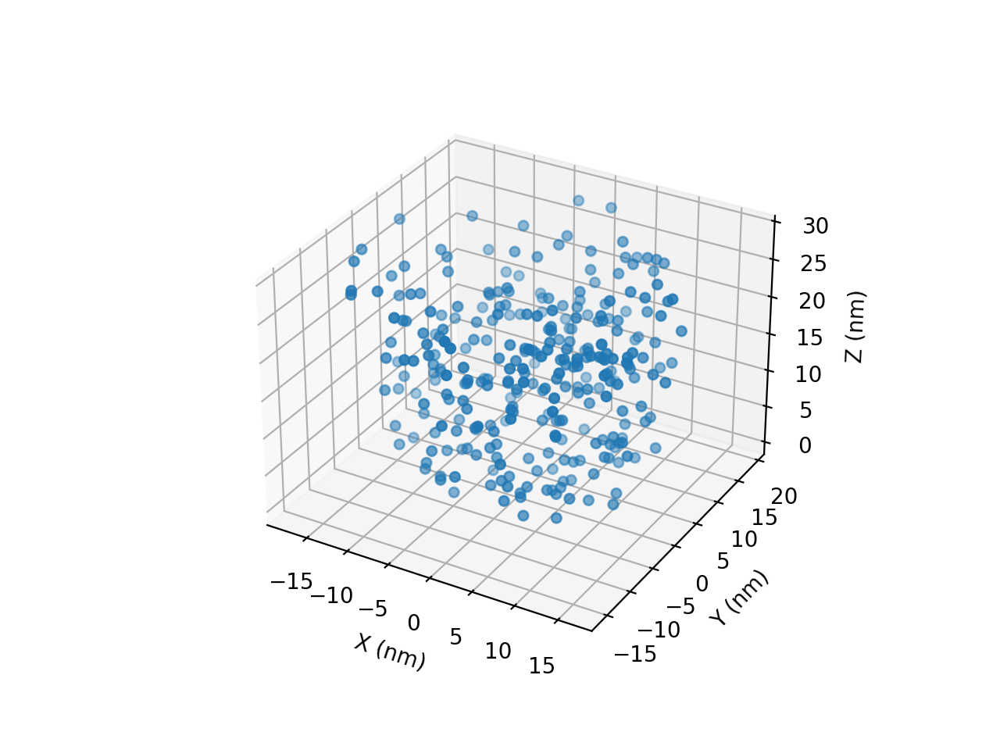

In [278]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

mask = np.random.randint(0, len(px), 300)

ax.scatter(px[mask], py[mask], pz[mask])
ax.set_xlabel('X (nm)')
ax.set_ylabel('Y (nm)')
ax.set_zlabel('Z (nm)')

plt.show()

In [282]:
df = pd.DataFrame()

dld_highVoltage_s = np.zeros(len(px), dtype='object' )
dld_pulseVoltage_s = np.zeros(len(px), dtype='object')
dld_x_s = np.zeros(len(px), dtype='object' )
dld_y_s = np.zeros(len(px), dtype='object')
dld_t_s = np.zeros(len(px), dtype='object' )
px_s = np.zeros(len(px), dtype='object')
py_s = np.zeros(len(px), dtype='object')
pz_s = np.zeros(len(px), dtype='object')
color = np.zeros(len(px), dtype='object' )
element = np.zeros(len(px), dtype='object')


for index, elemen in enumerate(phases):
    mask = np.logical_and((peaks_sides_p[index,2] < mc), (mc < peaks_sides_p[index,3])).squeeze()
    print(mask[mask==True].shape)

    if index==12 or index==13:
        max_plot = 0.02
    index_true = np.where(mask==True)
    index_get_to_false = np.random.choice(index_true[0], size=int(index_true[0].shape[0] - index_true[0].shape[0]*max_plot), replace=False)
    mask[index_get_to_false] = False
    print('ploted ions', mask[mask==True].shape)
    
    dld_highVoltage_s[mask] = dld_highVoltage[mask]
    dld_pulseVoltage_s[mask] = dld_pulseVoltage[mask]
    dld_x_s[mask] = dld_x[mask]
    dld_y_s[mask] = dld_y[mask]
    dld_t_s[mask] = dld_t[mask]
    px_s[mask] = px[mask]
    py_s[mask] = py[mask]
    pz_s[mask] = pz[mask]
    color[mask] = colors[index]
    element[mask] = elemen

    

df['highVoltage'] = dld_highVoltage_s
df['pulseVoltage'] = dld_pulseVoltage_s
df['dld_x'] = dld_x_s
df['dld_y'] = dld_y_s
df['dld_y'] = dld_t_s
df['x'] = px_s
df['y'] = py_s
df['z'] = pz_s
df['color'] = color
df['element'] = element

(992,)
ploted ions (20,)
(1057,)
ploted ions (22,)
(195,)
ploted ions (4,)
(168,)
ploted ions (4,)
(157,)
ploted ions (4,)
(5760,)
ploted ions (116,)
(7934,)
ploted ions (159,)
(316,)
ploted ions (7,)
(310,)
ploted ions (7,)
(399,)
ploted ions (8,)
(5587,)
ploted ions (112,)
(98264,)
ploted ions (1966,)
(914520,)
ploted ions (18291,)
(605176,)
ploted ions (12104,)


In [283]:
df

,highVoltage,pulseVoltage,dld_x,dld_y,x,y,z,color,element
0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
1178613,0,0,0,0,0,0,0,0,0
1178614,0,0,0,0,0,0,0,0,0
1178615,0,0,0,0,0,0,0,0,0
1178616,0,0,0,0,0,0,0,0,0


In [318]:
import plotly.graph_objects as go
import plotly.express as plot_x

fig = go.Figure()
for index, elemen in enumerate(phases):
    df_s = df[df['color'].str.contains(colors[index], na=False)]
    fig.add_trace(go.Scatter3d(x=df_s['x'], y=df_s['y'], z=df_s['z'], mode='markers',
                               name=elemen,
                               showlegend=True,
                              marker = dict(
                                size=2,
                                color=colors[index],
                                opacity=.2,
                                    )
                              ))
    print(elemen)
fig.update_scenes(
    xaxis_title="x (nm)",
    yaxis_title="y (nm)",
    zaxis_title="z (nm)")
fig.update_layout( legend_title="Elements:", title="APT",)
fig.update_scenes(zaxis_autorange="reversed")
fig.update_layout(legend= {'itemsizing': 'constant'})
fig.show()

H1(+)
H2(+)
O(++)
H2O(+)
P(3+)
C12(+)
12.49
C13(+)
13.47
Si28(+)
Fe57(2+)
Cr52(2+)
Fe55(2+)
Fe56(2+)


In [313]:
x_eye = -1.25
y_eye = 2
z_eye = 0.5

fig.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )

fig.update_layout(
         width=600,
         height=600,
         scene_camera_eye=dict(x=x_eye, y=y_eye, z=z_eye),
         updatemenus=[dict(type='buttons',
                  showactive=False,
                  y=1.2,
                  x=0.8,
                  xanchor='left',
                  yanchor='bottom',
                  pad=dict(t=45, r=10),
                  buttons=[dict(label='Play',
                                 method='animate',
                                 args=[None, dict(frame=dict(duration=15, redraw=True), 
                                                             transition=dict(duration=0),
                                                             fromcurrent=True,
                                                             mode='immediate'
                                                            )]
                                            )
                                      ]
                              )
                        ]
)


def rotate_z(x, y, z, theta):
    w = x+1j*y
    return np.real(np.exp(1j*theta)*w), np.imag(np.exp(1j*theta)*w), z

frames=[]
for t in np.arange(0, 20, 0.1):
    xe, ye, ze = rotate_z(x_eye, y_eye, z_eye, -t)
    frames.append(go.Frame(layout=dict(scene_camera_eye=dict(x=xe, y=ye, z=ze))))
fig.frames=frames

fig.show()

In [ ]:
# save the new data
name_save_file = variables.result_path + '//' + dataset_name + '.h5'
data_tools.store_df_to_hdf(name_save_file, data, 'df')